### **Connecting to the drive to use the** **dataset**



In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Function to process the data in dataset** (Image preprocessing)

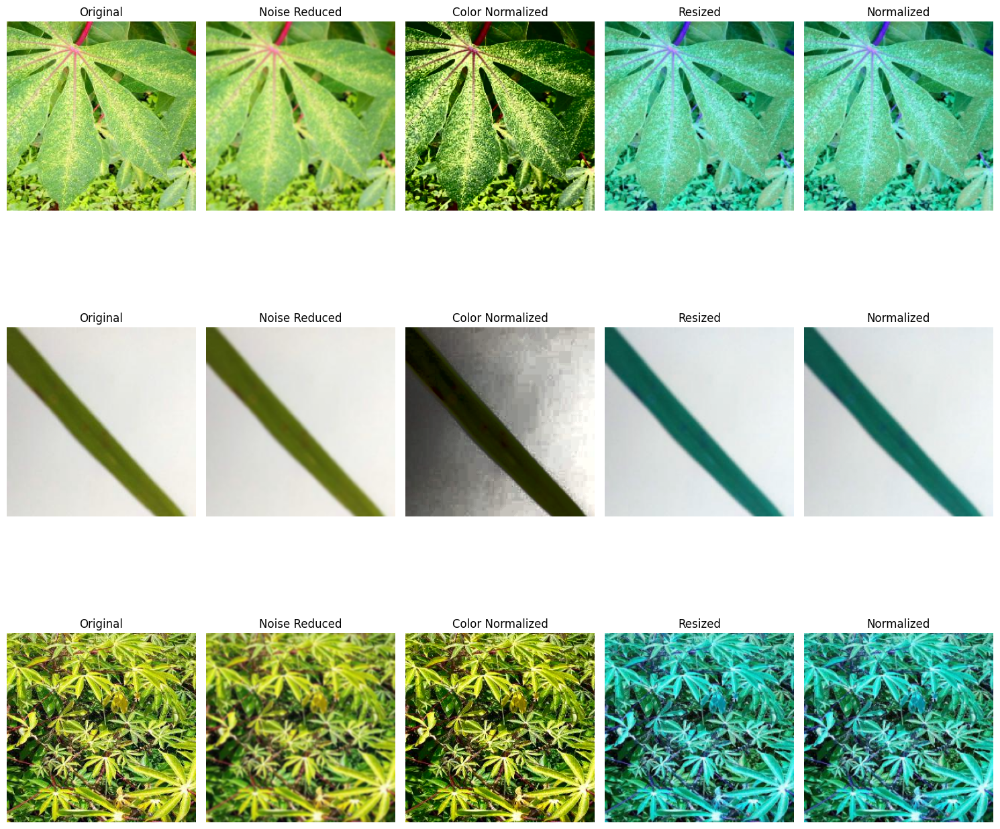

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Define the preprocessing functions
def noise_reduction(image):
    return cv2.GaussianBlur(image, (5, 5), 0)

def color_normalization(image):
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
    l, a, b = cv2.split(lab_image)
    l = cv2.equalizeHist(l)
    lab_image = cv2.merge([l, a, b])
    return cv2.cvtColor(lab_image, cv2.COLOR_Lab2BGR)

def resize_image(image, target_size=(224, 224)):
    return cv2.resize(image, target_size)

def normalize_image(image):
    return image / 255.0

# Define the preprocessing pipeline
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    processed_images = {
        "Original": cv2.cvtColor(image, cv2.COLOR_BGR2RGB),  # Convert to RGB for visualization
        "Noise Reduced": cv2.cvtColor(noise_reduction(image), cv2.COLOR_BGR2RGB),
        "Color Normalized": cv2.cvtColor(color_normalization(image), cv2.COLOR_BGR2RGB),
        "Resized": resize_image(image),
        "Normalized": normalize_image(resize_image(image))
    }
    return processed_images

# Visualization setup
def visualize_preprocessing(data_folder, num_images=3):
    # Randomly pick images from the dataset
    image_paths = []
    for root, _, files in os.walk(data_folder):
        image_paths.extend([os.path.join(root, file) for file in files if file.endswith(".jpg")])

    # Select a subset of images
    sample_paths = np.random.choice(image_paths, size=min(num_images, len(image_paths)), replace=False)

    # Plot the original and processed images
    plt.figure(figsize=(15, 5 * len(sample_paths)))
    for i, image_path in enumerate(sample_paths):
        processed_images = preprocess_image(image_path)
        for j, (title, img) in enumerate(processed_images.items()):
            plt.subplot(len(sample_paths), len(processed_images), i * len(processed_images) + j + 1)
            plt.imshow(img if isinstance(img, np.ndarray) else img.numpy())
            plt.title(title)
            plt.axis("off")
    plt.tight_layout()
    plt.show()

# Specify the data folder and visualize
data_folder = '/content/drive/My Drive/PlantDataSet/test'  #preprocesses any 3 random images and displayes the output
visualize_preprocessing(data_folder, num_images=3)


**Another kind of function for preprocessing**
(Uses advanced preprocessing techniques like histogram equilization)

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/cercospora leaf spot gray leaf spot/fd1e7be2-d635-4d70-85ac-f5d68ce7c2d1___RS_GLSp 4450 copy.jpg


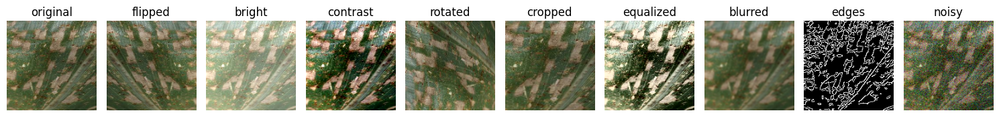

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/cercospora leaf spot gray leaf spot/a42e0a8a-560a-4659-96ed-3af63cf57b77___RS_GLSp 9313 copy.jpg


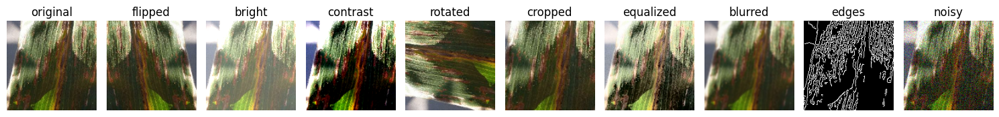

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/cercospora leaf spot gray leaf spot/1f23992c-3a9f-4ebb-a89f-6272ee23c7c4___RS_GLSp 4500 copy.jpg


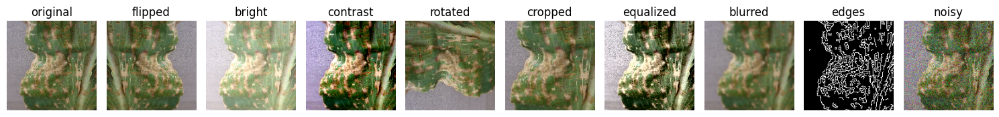

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/cercospora leaf spot gray leaf spot/b9bfa8c8-2e32-4a0c-8ac5-aa2b57e9df73___RS_GLSp 4579 copy.jpg


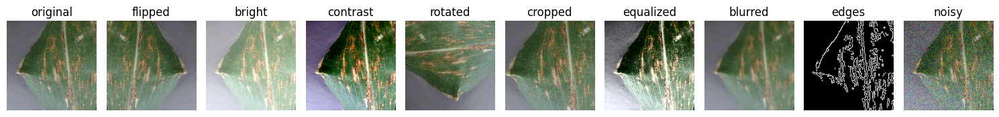

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/cercospora leaf spot gray leaf spot/9043a294-8d22-405f-add1-7e5bf1606e7a___RS_GLSp 4431 copy 2.jpg


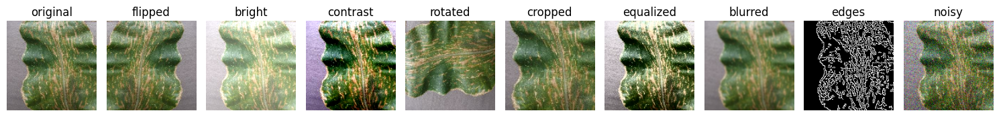

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/cercospora leaf spot gray leaf spot/ed2d6237-f67a-4a5b-bd44-f122388bcd80___RS_GLSp 4620 copy.jpg


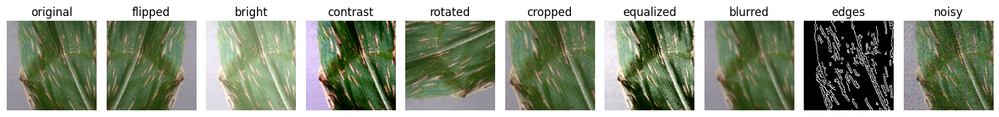

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/e0458a0b-eb48-4384-b16b-117706bbe0be___R.S_HL 8192 copy.jpg


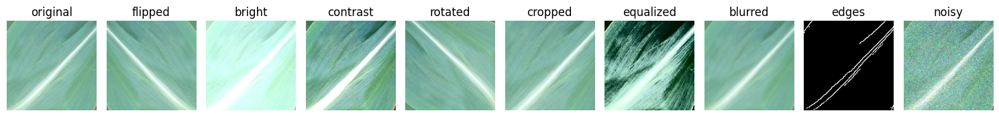

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/3530ef6f-503f-4ccc-8122-9b1b84ae01b8___R.S_HL 8178 copy 3.jpg


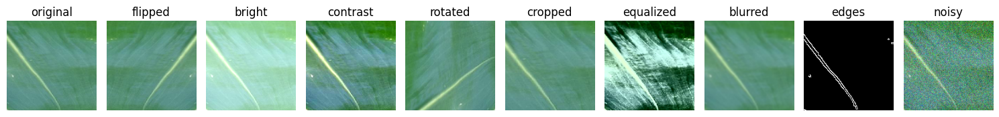

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/0d61ead9-f316-408e-88f5-fbecdfb11c1a___R.S_HL 8324 copy 3.jpg


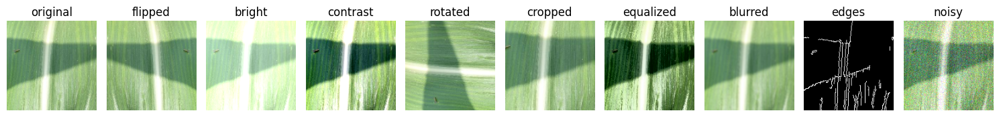

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/35f5abfd-1feb-4dc6-9607-8a0655a2ab9c___R.S_HL 8175 copy 3.jpg


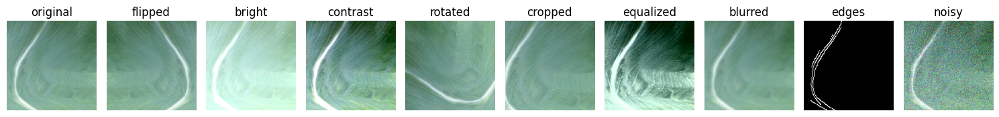

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/888320cd-1305-4d03-9323-a82d8a334414___R.S_HL 7885 copy.jpg


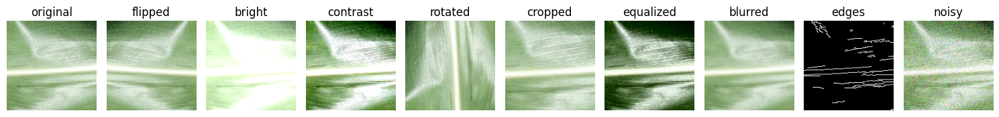

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/1fb30be0-c5e0-4e31-a9e4-329194e87cd7___R.S_HL 8134 copy.jpg


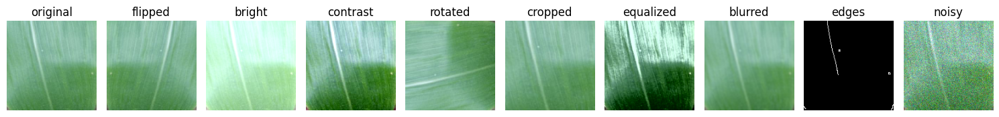

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/bd387a28-3b26-47d8-827b-062ae0a0f234___R.S_HL 7990 copy 2.jpg


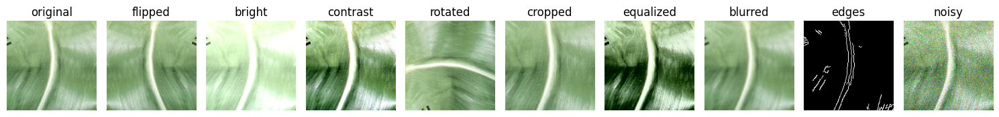

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/e3881e5b-b266-413d-89fd-4ee6eca1f00b___R.S_HL 0646 copy 4.jpg


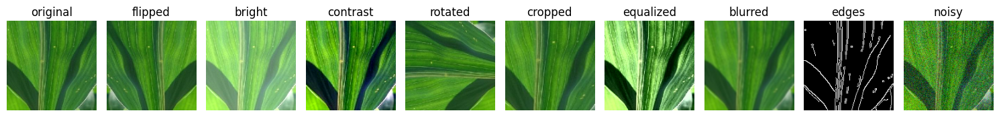

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/650d4770-c4b9-4854-8476-681d9d93034c___R.S_HL 5557 copy.jpg


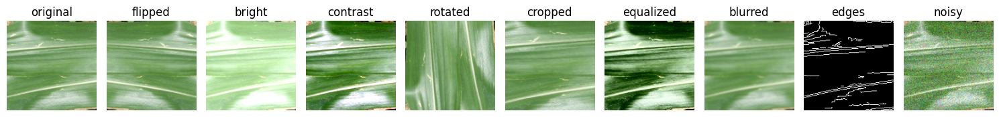

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/db9acaef-81ac-43d5-9cc2-74ca5182726a___R.S_HL 8318 copy.jpg


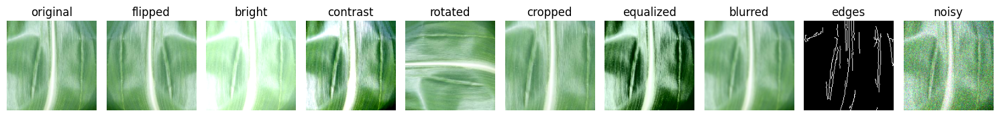

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/690aa499-e65c-42a5-ac1a-2eeebeb9ee9f___R.S_HL 5554 copy 2.jpg


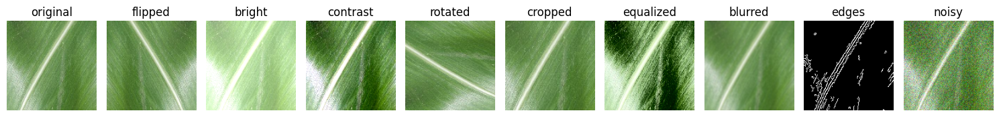

Processing: /content/drive/My Drive/PlantDataSet/test/corn (maize)/healthy/f29a6d6b-c2b2-496a-8463-06ce5f44327a___R.S_HL 8076 copy.jpg


KeyboardInterrupt: 

In [ ]:
import tensorflow as tf
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def preprocess_image(image_path):
    # Load and decode image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)

    # Resize image
    image = tf.image.resize(image, [150, 150])

    # Normalize image (scale pixel values to [0, 1])
    image = image / 255.0

    # Apply basic image processing techniques
    flipped = tf.image.flip_left_right(image)                      # Flip horizontally
    bright = tf.image.adjust_brightness(image, 0.3)               # Brightness adjustment
    contrast = tf.image.adjust_contrast(image, 2)                 # Contrast adjustment
    rotated = tf.image.rot90(image)                               # Rotate 90 degrees
    cropped = tf.image.central_crop(image, central_fraction=0.8)  # Central crop

    # Define advanced image processing functions
    def histogram_equalization(image):
        img_array = (image.numpy() * 255).astype("uint8")
        img_yuv = cv2.cvtColor(img_array, cv2.COLOR_RGB2YUV)
        img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
        equalized = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
        return tf.convert_to_tensor(equalized / 255.0)

    def gaussian_blur(image):
        img_array = (image.numpy() * 255).astype("uint8")
        blurred = cv2.GaussianBlur(img_array, (5, 5), 0)  # Kernel size (5, 5)
        return tf.convert_to_tensor(blurred / 255.0)

    def edge_detection(image):
        img_array = (image.numpy() * 255).astype("uint8")
        edges = cv2.Canny(img_array, 100, 200)
        edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
        return tf.convert_to_tensor(edges_rgb / 255.0)

    def add_random_noise(image):
        img_array = image.numpy()
        noise = np.random.normal(0, 0.1, img_array.shape)  # Gaussian noise
        noisy_image = np.clip(img_array + noise, 0, 1)
        return tf.convert_to_tensor(noisy_image)

    # Applying advanced techniques
    equalized = histogram_equalization(image)          # Histogram Equalization
    blurred = gaussian_blur(image)                     # Gaussian Blur
    edges = edge_detection(image)                      # Edge Detection
    noisy = add_random_noise(image)                    # Add Random Noise

    # Return all processed versions in a dictionary
    return {
        "original": image,
        "flipped": flipped,
        "bright": bright,
        "contrast": contrast,
        "rotated": rotated,
        "cropped": cropped,
        "equalized": equalized,
        "blurred": blurred,
        "edges": edges,
        "noisy": noisy
    }

def process_and_visualize_images(data_folder):
    # Iterate through each folder and image in the provided directory
    for root, dirs, files in os.walk(data_folder):
        for file in files:
            if file.endswith(".jpg"):  # Process only .jpg files
                image_path = os.path.join(root, file)
                print(f"Processing: {image_path}")

                # Preprocess the image
                processed_images = preprocess_image(image_path)

                # Visualize the processed images
                plt.figure(figsize=(15, 5))
                for i, (title, img) in enumerate(processed_images.items()):
                    plt.subplot(1, len(processed_images), i + 1)
                    plt.imshow(img)
                    plt.title(title)
                    plt.axis("off")
                plt.tight_layout()
                plt.show()

# Define the data folder path based on your directory structure
data_folder = '/content/drive/My Drive/PlantDataSet/test'  # Update with your folder path

# Call the function to process and visualize images
process_and_visualize_images(data_folder)


Converting output to zip file and storing it in drive


In [ ]:
# import shutil
# import os

# # Define the output folder and zip file name
# output_dir = '/content/drive/My Drive/PlantDataSet/output3'
# zip_file_path = '/content/drive/My Drive/PlantDataSet/output33.zip'

# # Create a zip archive of the output3 folder
# print("Creating ZIP file...")
# shutil.make_archive(zip_file_path.replace('.zip', ''), 'zip', output_dir)
# print(f"ZIP file created: {zip_file_path}")


Creating ZIP file...
ZIP file created: /content/drive/My Drive/PlantDataSet/output33.zip


**Code to store preprocessed images in drive in seperated folders for each one **

In [ ]:
# ######################################## EXTRA FIRST ONE ##############################################################
# import os
# import cv2
# import numpy as np
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tqdm import tqdm

# # Define input and output directories
# input_dir = '/content/drive/My Drive/PlantDataSet/test'
# output_dir = '/content/drive/My Drive/PlantDataSet/output3'
# os.makedirs(output_dir, exist_ok=True)

# # Preprocessing function
# def preprocess_image(image):
#     # Apply Gaussian Blur (noise reduction)
#     image = cv2.GaussianBlur(image, (5, 5), 0)
#     # Convert to LAB color space and equalize the L channel (color normalization)
#     lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
#     l, a, b = cv2.split(lab_image)
#     l = cv2.equalizeHist(l)
#     lab_image = cv2.merge([l, a, b])
#     image = cv2.cvtColor(lab_image, cv2.COLOR_Lab2BGR)
#     # Resize and normalize the image
#     image = cv2.resize(image, (224, 224))
#     return image / 255.0  # Normalize to [0, 1]

# # Data augmentation generator
# datagen = ImageDataGenerator(
#     rotation_range=30,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     shear_range=0.2,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     fill_mode='nearest'
# )

# # Function to process all folders in the test directory
# def process_all_folders():
#     for main_folder in tqdm(os.listdir(input_dir), desc="Processing main folders", unit="folder"):
#         input_main_folder = os.path.join(input_dir, main_folder)
#         if os.path.isdir(input_main_folder):
#             output_main_folder = os.path.join(output_dir, main_folder)
#             os.makedirs(output_main_folder, exist_ok=True)

#             # Process all subfolders inside each main folder
#             for subfolder in os.listdir(input_main_folder):
#                 input_subfolder = os.path.join(input_main_folder, subfolder)
#                 if os.path.isdir(input_subfolder):
#                     output_subfolder = os.path.join(output_main_folder, subfolder)
#                     os.makedirs(output_subfolder, exist_ok=True)

#                     # Process all images in the subfolder
#                     for image_name in tqdm(os.listdir(input_subfolder), desc=f"Processing {subfolder}", unit="image"):
#                         if image_name.endswith(".jpg"):
#                             # Load and preprocess the image
#                             image_path = os.path.join(input_subfolder, image_name)
#                             image = cv2.imread(image_path)
#                             if image is None:
#                                 continue
#                             image = preprocess_image(image)

#                             # Generate one augmented image
#                             image = np.expand_dims(image, axis=0)  # Add batch dimension
#                             augmented_image = next(datagen.flow(image, batch_size=1))[0]  # Generate one image
#                             augmented_image = (augmented_image * 255).astype(np.uint8)  # Convert to uint8

#                             # Save the augmented image
#                             output_image_path = os.path.join(output_subfolder, image_name)
#                             cv2.imwrite(output_image_path, augmented_image)

# # Process all folders in the "test" directory
# process_all_folders()


Processing healthy: 100%|██████████| 147/147 [00:00<00:00, 472100.07image/s]

Processing bacterial spot: 100%|██████████| 99/99 [00:00<00:00, 528963.18image/s]

Processing cercospora leaf spot gray leaf spot: 100%|██████████| 51/51 [00:00<00:00, 138.68image/s]

Processing common rust: 100%|██████████| 119/119 [00:00<00:00, 516689.62image/s]

Processing main folders:   8%|▊         | 1/13 [00:03<00:43,  3.65s/folder]


KeyboardInterrupt: 